<a href="https://colab.research.google.com/github/meichenfang/Poisson-regression/blob/main/demos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<font size="+4"><center> Demonstrations </center></font> 

# Load packages

In [1]:
%cd ../RADOM

# restrict numpy to use only one core, otherwise it will use all cores when doing @
import os
os.environ["BLAS_NUM_THREADS"] = "1" 
os.environ["OPENBLAS_NUM_THREADS"] = "1" # 


from inference import Trajectory
from plotting import *
from models.two_species import get_Y

/home/mffang/workspace/Poisson-regression/RADOM


In [2]:
import numpy as np
import pickle
from tqdm import tqdm
import matplotlib.pyplot as plt
from scipy import stats
import copy
import time

In [3]:
%cd ../simulation_results
results_dir = 'two_species/'

if not os.path.exists(results_dir):
    os.makedirs(results_dir)

/home/mffang/workspace/Poisson-regression/simulation_results


In [4]:
loga_max = 4
logb_var = 1
logb_mu =1

# A simple case

We rescale the time by average half lives of mRNA

In [5]:
def simulate_data(topo, tau, n, p, loga_max=5, logb_max=3, random_seed=42):
    np.random.seed(random_seed)
    L=len(topo)
    n_states=len(set(topo.flatten()))
    t=np.linspace(tau[0],tau[-1],n)
    true_t = []
    
    theta=np.zeros((p,n_states+3))
    for j in range(n_states+1):
        theta[:,j]=np.exp(np.random.uniform(0,loga_max,size=p))-1+1e-3
    theta[:,-2:]=np.exp(np.random.normal(logb_mu,logb_var,size=(p,2)))
    
    Y = np.zeros((n*L,p,2))
    for l in range(L):
        theta_l = np.concatenate((theta[:,topo[l]], theta[:,-3:]), axis=1)
        Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
        true_t = np.append(true_t,t)

    X = np.random.poisson(Y)
    return theta, true_t, Y, X,

In [9]:
def simulate_data_null(topo, tau, n, true_p, null_p, loga_max=4, logb_max=1, random_seed=42):
    np.random.seed(random_seed)
    L=len(topo)
    n_states=len(set(topo.flatten()))
    t=np.linspace(tau[0],tau[-1],n)
    true_t = []
    p = true_p + null_p
    
    theta=np.zeros((p,n_states+3))
    for j in range(n_states+1):
        theta[:,j]=np.exp(np.random.uniform(0,loga_max,size=p))-1+1e-3
    theta[:,-2:]=np.exp(np.random.normal(logb_mu,logb_var,size=(p,2)))
    
    for j in range(1,n_states):
        theta[true_p:,j]=theta[true_p:,0]
    theta[true_p:,-2] = 1
    theta[true_p:,-1] = theta[true_p:,-4]/theta[true_p:,-3]
    
    Y = np.zeros((n*L,p,2))
    for l in range(L):
        theta_l = np.concatenate((theta[:,topo[l]], theta[:,-3:]), axis=1)
        Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
        true_t = np.append(true_t,t)

    X = np.random.poisson(Y)
    return theta, true_t, Y, X,

In [10]:
#%% generate data
n=1000
p=100
topo = np.array([[0,1],[0,2]])
tau = (0,1)
true_theta, true_t, Y, X = simulate_data(topo,tau,n=n,p=p,random_seed=2023)
#true_theta, t, Y, X = simulate_data_null(topo,tau,n=2000,true_p=50,null_p=50,random_seed=2023)

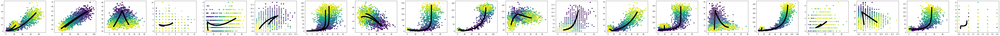

In [11]:
p = 20
fig, ax = plt.subplots(1,p,figsize=(6*p,4))
for i in range(p):
    #ax[i].plot(Y[:,i,1]*gamma[i],Y[:,i,1],'--', color='gray');
    ax[i].scatter(X[:,i,0],X[:,i,1],c=true_t);
    ax[i].scatter(Y[:,i,0],Y[:,i,1],c='black');
# time increases from blue to red

## Unrestricted

In [10]:
traj = Trajectory(topo, tau, model="two_species", verbose=1)
traj = traj.fit(X,m=100,n_init=10,perm_theta=False,epoch=10,parallel=True,n_threads=4)

run method fit_multi_init
trial 1


100%|██████████| 10/10 [00:09<00:00,  1.08it/s]

trial 2



100%|██████████| 10/10 [00:09<00:00,  1.01it/s]

trial 3



100%|██████████| 10/10 [00:09<00:00,  1.06it/s]

trial 4



100%|██████████| 10/10 [00:09<00:00,  1.03it/s]

trial 5



100%|██████████| 10/10 [00:09<00:00,  1.01it/s]

trial 6



100%|██████████| 10/10 [00:08<00:00,  1.15it/s]

trial 7



100%|██████████| 10/10 [00:07<00:00,  1.34it/s]

trial 8



100%|██████████| 10/10 [00:08<00:00,  1.13it/s]

trial 9



100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

trial 10



100%|██████████| 10/10 [00:07<00:00,  1.27it/s]


(<Figure size 4320x288 with 10 Axes>,
 array([<AxesSubplot:title={'center':'0'}>,
        <AxesSubplot:title={'center':'1'}>,
        <AxesSubplot:title={'center':'2'}>,
        <AxesSubplot:title={'center':'3'}>,
        <AxesSubplot:title={'center':'4'}>,
        <AxesSubplot:title={'center':'5'}>,
        <AxesSubplot:title={'center':'6'}>,
        <AxesSubplot:title={'center':'7'}>,
        <AxesSubplot:title={'center':'8'}>,
        <AxesSubplot:title={'center':'9'}>], dtype=object))

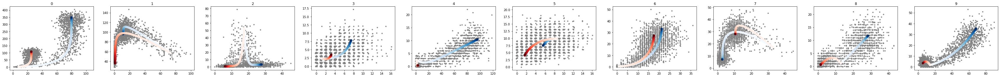

In [11]:
plot_phase(traj,idx=np.arange(10))

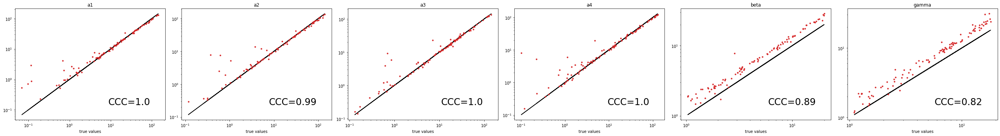

In [12]:
plot_theta(true_theta,traj.theta);

<AxesSubplot:>

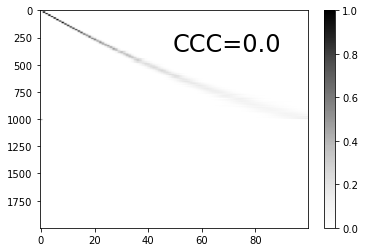

In [13]:
plot_t(traj,t=t)

<AxesSubplot:>

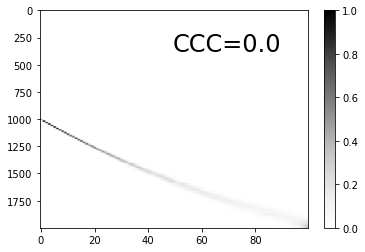

In [14]:
plot_t(traj,t=t,l=1)

run method fit_multi_init
trial 1


100%|██████████| 100/100 [00:54<00:00,  1.83it/s]

trial 2



100%|██████████| 100/100 [00:57<00:00,  1.74it/s]

trial 3



100%|██████████| 100/100 [00:49<00:00,  2.02it/s]

trial 4



100%|██████████| 100/100 [00:51<00:00,  1.93it/s]

trial 5



100%|██████████| 100/100 [00:47<00:00,  2.09it/s]

trial 6



100%|██████████| 100/100 [00:53<00:00,  1.86it/s]

trial 7



100%|██████████| 100/100 [00:52<00:00,  1.90it/s]

trial 8



100%|██████████| 100/100 [00:54<00:00,  1.82it/s]

trial 9



100%|██████████| 100/100 [00:52<00:00,  1.90it/s]

trial 10



100%|██████████| 100/100 [00:47<00:00,  2.10it/s]


(<Figure size 2592x360 with 6 Axes>,
 array([<AxesSubplot:title={'center':'a1'}, xlabel='true values'>,
        <AxesSubplot:title={'center':'a2'}, xlabel='true values'>,
        <AxesSubplot:title={'center':'a3'}, xlabel='true values'>,
        <AxesSubplot:title={'center':'a4'}, xlabel='true values'>,
        <AxesSubplot:title={'center':'beta'}, xlabel='true values'>,
        <AxesSubplot:title={'center':'gamma'}, xlabel='true values'>],
       dtype=object))

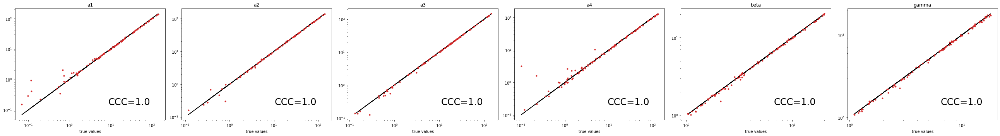

In [15]:
traj = Trajectory(topo, tau, model="two_species", verbose=1)
res = traj.fit(X,m=100,n_init=10,perm_theta=False,epoch=100,parallel=True,n_threads=10)
plot_theta(true_theta,traj.theta)

(<Figure size 2160x288 with 5 Axes>,
 array([<AxesSubplot:title={'center':'6'}>,
        <AxesSubplot:title={'center':'25'}>,
        <AxesSubplot:title={'center':'76'}>,
        <AxesSubplot:title={'center':'82'}>,
        <AxesSubplot:title={'center':'85'}>], dtype=object))

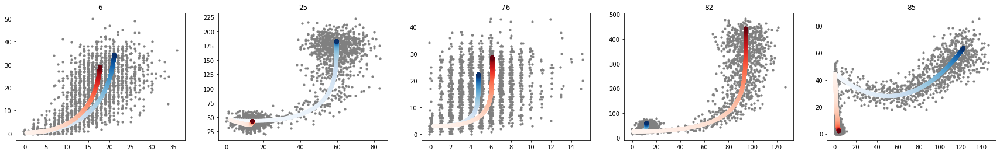

In [16]:
err = np.abs(traj.theta-true_theta)/true_theta
idx = np.arange(100)[err[:,0]>1]
plot_phase(traj,idx=idx)

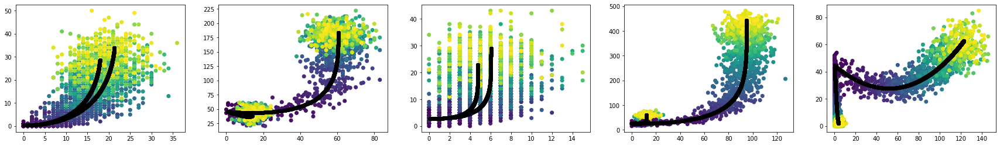

In [21]:
t = np.linspace(0,1,n)
fig, ax = plt.subplots(1,len(idx),figsize=(6*len(idx),4))
for i,j in enumerate(idx):
    #ax[i].plot(Y[:,i,1]*gamma[i],Y[:,i,1],'--', color='gray');
    ax[i].scatter(X[:,j,0],X[:,j,1],c=true_t);
    ax[i].scatter(Y[:,j,0],Y[:,j,1],c='black');

## check AIC

In [28]:
AIC = -traj.compute_AIC(X)/2/n

$$E = E_y E_x \mathcal{L}(\hat\theta(y),x)$$
$$ AIC = \mathcal{L}(\hat\theta(y),y) - K$$
$$E_y AIC = E$$

In [ ]:
traj_ = copy.deepcopy(traj)
traj_.verbose=0
KK = 1000
E_x_L_theta_hat_y = np.zeros(KK)
AICs = np.zeros(KK)
for ii in range(KK):
    X_Y = np.random.poisson(Y)
    ## fit theta_hat_y
    traj_.fit(X_Y,theta=traj.theta)
    AICs[ii]=-traj_.compute_AIC(X_Y)/2/n
    L_theta_hat_y = []
    for jj in range(KK):
        X_X = np.random.poisson(Y)
        L_theta_hat_y.append(traj_.compute_lower_bound(X_X))
        
    E_x_L_theta_hat_y[ii] = np.mean(L_theta_hat_y)
    
E = np.mean(E_x_L_theta_hat_y)
E_AIC = np.mean(AICs)

702.2606138798809 702.2781883170303


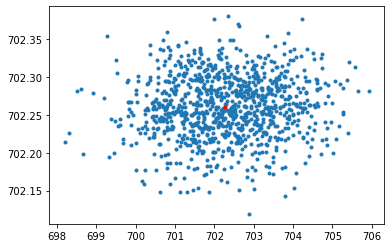

In [34]:
print(E, E_AIC)
plt.plot(AICs,E_x_L_theta_hat_y,'.');
plt.plot(E_AIC,E,'r.');

## Restricted

In [7]:
traj_r = Trajectory(topo, tau, restrictions={4:[[1],[0]]},verbose=1)
Q_r, _ = traj_r.fit_multi_init(X,100,n_init=3,epoch=20,parallel=True,n_threads=4)

trial 1


100%|██████████| 20/20 [00:07<00:00,  2.57it/s]

trial 2



 55%|█████▌    | 11/20 [00:04<00:03,  2.45it/s]

trial 3



 50%|█████     | 10/20 [00:04<00:04,  2.30it/s]


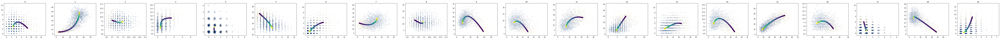

In [9]:
plot_phase(traj_r,idx=np.arange(20))

In [ ]:
traj_ = copy.deepcopy(traj_r)
traj_.verbose=0
KK = 100
E_x_L_theta_hat_y = np.zeros(KK)
AICs = np.zeros(KK)
for ii in range(KK):
    X_Y = np.random.poisson(Y)
    ## fit theta_hat_y
    traj_.fit(X_Y,theta=traj_r.theta)
    AICs[ii]=-traj_.compute_AIC(X_Y)/2/n
    L_theta_hat_y = []
    for jj in range(KK):
        X_X = np.random.poisson(Y)
        L_theta_hat_y.append(traj_.compute_lower_bound(X_X))
        
    E_x_L_theta_hat_y[ii] = np.mean(L_theta_hat_y)
    
E = np.mean(E_x_L_theta_hat_y)
E_AIC = np.mean(AICs)

702.4608150333157 702.2728145914439


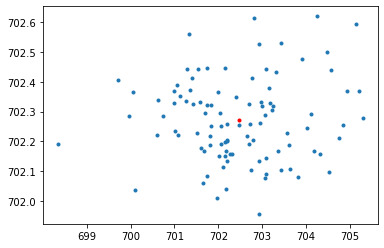

In [54]:
print(E_AIC, E)
plt.plot(AICs,E_x_L_theta_hat_y,'.');
plt.plot(E_AIC,E,'r.');

In [20]:
-traj_r.compute_AIC(X)/2/n

700.4390978030564

In [31]:
BIC = traj_r.compute_lower_bound(X) - traj_r.k*np.log(n)/n
BIC

700.112353131309

In [32]:
BIC = traj.compute_lower_bound(X) - traj.k*np.log(n)/n
BIC

700.1105339390238

# Vary p, n and topo

## Functions

### Fixed parameters

In [6]:
from multiprocessing import Pool
import time

def fit_wrapper(X,topo_,tau_, true_t, theta, m, n_init):
    traj = Trajectory(topo=topo_, tau=tau_, model="two_species")
    traj.fit(X,m=m,n_init=n_init,perm_theta=False,epoch=100,parallel=False)   
    traj.true_t = true_t
    traj.true_theta = theta
    return traj

In [7]:
def fit_vary_n_fixed(topo, tau, ns=[1000,3162,10000], p=100, seed=2023, K=10, n_init=10, epoch=100, m=100, cores=10):
    np.random.seed(seed)
    L = len(topo)     
    n_states=len(set(topo.flatten()))
    theta=np.zeros((p,n_states+3))
    for j in range(n_states+1):
        theta[:,j]=np.exp(np.random.uniform(0,loga_max,size=p))-1
    theta[:,-2:]=np.exp(np.random.normal(logb_mu,logb_var,size=(p,2)))
    
    Input_args = []
    for i,n in enumerate(ns):             
        for k in range(K):
            np.random.seed(k)
            true_t = []
            Y = np.zeros((n*L,p,2)) 
            for l in range(L):
                t = np.sort(np.random.uniform(tau[0],tau[-1],n))
                #t = np.linspace(tau[0],tau[-1],n)
                theta_l = np.concatenate((theta[:,topo[l]], theta[:,-3:]), axis=1)
                Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
                true_t = np.append(true_t,t)
        
            X = np.random.poisson(Y)
            
            Input_args.append((X, topo, tau, true_t, theta, m, n_init))
            

    with Pool(cores) as pool:      
        results = pool.starmap(fit_wrapper, Input_args, chunksize=1)

    return results

In [8]:
def fit_vary_p_fixed(topo, tau, n=1000, ps=[31,100,316], seed=2022, K=10, n_init=10, epoch=100, m=100, cores=10):
    np.random.seed(seed)
    L = len(topo)     
    n_states=len(set(topo.flatten()))
    p_total = int( np.max(ps) )
    theta_all=np.ones((p_total,n_states+3))
    
    ## theta
    for j in range(n_states+1):
        theta_all[:,j]=np.exp(np.random.uniform(0,loga_max,size=p_total))-1
    theta_all[:,-2:]=np.exp(np.random.normal(logb_mu,logb_var,size=(p_total,2)))
    
    Input_args = []
    for i,p in enumerate(ps):   
          
        Y = np.zeros((n*L,p,2))
        theta = theta_all[:p]
        
        for k in range(K):
            np.random.seed(k)
            true_t = []
            for l in range(L):
                #t=np.linspace(tau[0],tau[-1],n)
                t = np.sort(np.random.uniform(tau[0],tau[-1],n))
                theta_l = np.concatenate((theta[:,topo[l]], theta[:,-3:]), axis=1)
                Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
                true_t = np.append(true_t,t)
        
            X = np.random.poisson(Y)
            
            Input_args.append((X, topo, tau, true_t, theta, m, n_init))
        
    with Pool(cores) as pool:      
        results = pool.starmap(fit_wrapper, Input_args, chunksize=1)
                
    return results

In [9]:
def fit_vary_null_p_fixed(topo, tau, n=1000, p=100, null_ps=[10,31,100,316], seed=2022, K=10, n_init=3, epoch=100, m=100, cores=10):
    np.random.seed(seed)
    K = len(set(topo.flatten()))
    L = len(topo)     
    n_states=len(set(topo.flatten()))
    loga_max = 5
    logb_max = 3
    p_total = int( true_p + np.max(null_ps) )
    theta=np.ones((p_total,n_states+3))
    
    ## true_p
    for j in range(n_states+1):
        theta[:true_p,j]=np.exp(np.random.uniform(0,loga_max,size=true_p))-1
    theta[:true_p,-2]=np.exp(np.random.normal(logb_mu,logb_var,size=true_p))
    theta[:true_p,-1]=np.exp(np.random.normal(logb_mu,logb_var,size=true_p))
    
    ## null_p
    theta[true_p:,:n_states]=(np.exp(np.random.uniform(0,loga_max,size=np.max(null_ps)))-1)[:,None]
    theta[true_p:,n_states]=np.exp(np.random.uniform(0,logb_max,size=np.max(null_ps)))-1
    theta[true_p:,-1] = theta[true_p:,0]/theta[true_p:,-3]

    Input_args = []
    for i,null_p in enumerate(null_ps):   
        p = true_p + null_p
        threads = cores
        Y = np.zeros((n*L,p,2))
        
        for k,seed in enumerate(seeds):
            np.random.seed(seed)
            true_t = []
            for l in range(L):
                #t=np.linspace(tau[0],tau[-1],n)
                t = np.sort(np.random.uniform(tau[0],tau[-1],n))
                theta_l = np.concatenate((theta[:p,topo[l]], theta[:p,-3:]), axis=1)
                Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
                true_t = np.append(true_t,t)
        
            X = np.random.poisson(Y)
            
            Input_args.append((X, topo, tau, true_t, theta, m, n_init))
        
    with Pool(cores) as pool:      
        results = pool.starmap(fit_wrapper, Input_args)
                
    return results

### Plot results

In [10]:
plt.rcParams['font.size'] = '24'
label_font = '36'

In [11]:
def plot_theta_results(picklefile,K=10):
    with open(picklefile, 'rb') as f:
        results = pickle.load(f)
    test = results[0]
    p, n_theta = test.theta.shape
    print(n_theta)
    fig, ax = plt.subplots(len(results)//K,n_theta,figsize=(n_theta*6,len(results)//K*5),constrained_layout=True)
    
    for i in range(len(results)):
        traj = results[i]
        true_theta = traj.true_theta.copy()
        Q = traj.Q
        N,p,_ = traj.X.shape
        
        if len(traj.topo)>1:
            n = int(N/2)
            if np.sum(Q[:n,0])<np.sum(Q[:n,1]):
                true_theta[:,topo[0]] = traj.true_theta[:,topo[1]]
                true_theta[:,topo[1]] = traj.true_theta[:,topo[0]]

        for j in range(n_theta):
            ax[i//K,j].loglog(true_theta[:,j],traj.theta[:,j],'.');
            
    for i in range(len(results)//K):
        for j in range(n_theta):
            ax[i,j].loglog(true_theta[:,j],true_theta[:,j],'gray');        
            
    for j in range(n_theta-3):
        ax[0,j].set_title("α"+str(j),fontsize=label_font)      
    ax[0,-3].set_title("s0",fontsize=label_font)
    ax[0,-2].set_title("β",fontsize=label_font)
    ax[0,-1].set_title("γ",fontsize=label_font)
    fig.supxlabel('true value',fontsize=label_font);
    fig.supylabel('estimates',fontsize=label_font);
    return fig

In [12]:
def plot_t(traj,Q=None,l=0,ax=None,t=None,order_cells=False):
    if Q is None:
        Q = traj.Q
    t_hat=Q[:,l]@traj.t
    if ax is None:
        fig, ax = plt.subplots(1,1)
    if t is not None:
        if order_cells:
            order=np.argsort(t)
        else:
            order=np.arange(len(t))
        im = ax.imshow(Q[order,l,:],aspect="auto",cmap=cmap_Q);
        ax.text(0.9, 0.9, "CCC="+str(np.around(CCC(t_hat,t))), horizontalalignment='right', 
                 verticalalignment='top', transform=ax.transAxes, color="black",fontsize=24);
    else:
        if order_cells:
            order=np.argsort(t_hat)
        else:
            order=np.arange(len(t_hat))
        im = ax.imshow(Q[order,l,:],aspect="auto",cmap=cmap_Q);
    return ax

In [13]:
def plot_t_results(picklefile,K=10):
    with open(picklefile, 'rb') as f:
        results = pickle.load(f)
    test = results[0]
    L = len(test.topo)
    if hasattr(test,"elbos"):
        print("n_init = ",len(test.elbos))
    fig, ax = plt.subplots(len(results)//K,L*K,figsize=(L*K*4,len(results)//K*3),constrained_layout=True)
    for i in range(len(results)):
        traj = results[i]
        Q = traj.Q.copy()
        N,p,_ = traj.X.shape
        n = N//L
        
        if L==2:
            if np.sum(Q[:n,0])<np.sum(Q[:n,1]):
                Q[:,0] = traj.Q[:,1]
                Q[:,1] = traj.Q[:,0]

        for l in range(L):
            plot_t(traj,Q=Q,l=l,ax=ax[i//K,L*(i%K)+l],t=traj.true_t)
            
    #fig.supxlabel('time grids',fontsize=label_font);
    #fig.supylabel('ordered cells',fontsize=label_font);
    return fig

In [14]:
def plot_vary_n_results(picklefile,ns=[1000,3162,10000],K=10,llim=1e-4,hlim=1e3):
    with open(picklefile, 'rb') as f:
        results = pickle.load(f)
    test = results[0]
    p, n_theta = test.theta.shape
    
    abs_err = np.zeros((len(ns),K,p,n_theta))
    rel_err = np.zeros((len(ns),K,p,n_theta))
    for i in range(len(results)):
        traj = results[i]
        true_theta = traj.true_theta.copy()
        Q = traj.Q
        n = ns[i//K]
        
        if len(traj.topo)==2:
            if np.sum(Q[:n,0])<np.sum(Q[:n,1]):
                true_theta[:,topo[0]] = traj.true_theta[:,topo[1]]
                true_theta[:,topo[1]] = traj.true_theta[:,topo[0]]
        abs_err[i//K,i%K]=np.abs(traj.theta-true_theta)
        rel_err[i//K,i%K]=np.abs(traj.theta-true_theta)/true_theta

    fig, ax = plt.subplots(1,n_theta,figsize=(n_theta*6,5),constrained_layout=True)
    for i in range(p):
        for j in range(n_theta):
            ax[j].loglog(ns,rel_err[:,:,i,j].mean(axis=1),alpha=0.1);

    for j in range(n_theta-3):
        ax[j].set_title("α"+str(j),fontsize=label_font)
        
    ax[-3].set_title("s0",fontsize=label_font)
    ax[-2].set_title("β",fontsize=label_font)
    ax[-1].set_title("γ",fontsize=label_font)
    plt.setp(ax, ylim=(llim,hlim));
    fig.supylabel('relative error',fontsize=label_font);
    fig.supxlabel('number of cells',fontsize=label_font);

    """
    fig, ax = plt.subplots(1,5,figsize=(5*6,5),constrained_layout=True)
    for j in range(5):
        ax[j].loglog(ns,rel_err[:,:,:,j].mean(axis=(1,2)));

    ax[0].set_title("α1")
    ax[1].set_title("u0")
    ax[2].set_title("s0")
    ax[3].set_title("β")
    ax[4].set_title("γ")
    plt.setp(ax, ylim=(0.1,10));
    fig.supxlabel('number of cells n');
    fig.supylabel('relative error');
    """
    return fig

In [15]:
def plot_vary_p_results(picklefile,ps=[31,100,316],K=10,llim=1e-4,hlim=1e3):
    with open(picklefile, 'rb') as f:
        results = pickle.load(f)
    test = results[-1]
    p, n_theta = test.theta.shape

    abs_err = np.zeros((len(ps),K,p,n_theta))
    rel_err = np.zeros((len(ps),K,p,n_theta))
    for i in range(len(results)):
        traj = results[i]
        true_theta = traj.true_theta.copy()
        Q = traj.Q
        p = ps[i//K]
        N = traj.X.shape[0]
        
        if len(traj.topo)==2:
            n = N//2
            if np.sum(Q[:n,0])<np.sum(Q[:n,1]):
                true_theta[:,topo[0]] = traj.true_theta[:,topo[1]]
                true_theta[:,topo[1]] = traj.true_theta[:,topo[0]]

        rel_err[i//K,i%K,:p] = np.abs(traj.theta-true_theta)/true_theta

    fig, ax = plt.subplots(1,n_theta,figsize=(n_theta*6,5),constrained_layout=True)
    last_p = 0
    for i,p in enumerate(ps):
        for j in range(n_theta):
            ax[j].loglog(ps[i:],rel_err[i:,:,last_p:p,j].mean(axis=1),alpha=0.1);
        last_p = p

    for j in range(n_theta-3):
        ax[j].set_title("α"+str(j),fontsize=label_font)
    
    ax[-3].set_title("u0",fontsize=label_font)
    ax[-2].set_title("β",fontsize=label_font)
    ax[-1].set_title("γ",fontsize=label_font)
    plt.setp(ax, ylim=(llim,hlim));
    fig.supylabel('relative error',fontsize=label_font);
    fig.supxlabel('number of genes',fontsize=label_font);

    """
    fig, ax = plt.subplots(1,5,figsize=(5*6,5),constrained_layout=True)
    for j in range(5):
        ax[j].loglog(ns,rel_err[:,:,:,j].mean(axis=(1,2)));

    ax[0].set_title("α1")
    ax[1].set_title("u0")
    ax[2].set_title("s0")
    ax[3].set_title("β")
    ax[4].set_title("γ")
    plt.setp(ax, ylim=(0.1,10));
    fig.supxlabel('number of cells n');
    fig.supylabel('relative error');
    """
    return fig

## Topo 1: one lineage and one transition

### Vary n

In [17]:
topo = np.array([[0,1]])
tau = (0,1)
results = fit_vary_n_fixed(topo, tau, p=100, seed=1, K=10, n_init=10, epoch=100, m=100, cores=30)

with open(results_dir+'topo_1_vary_n_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

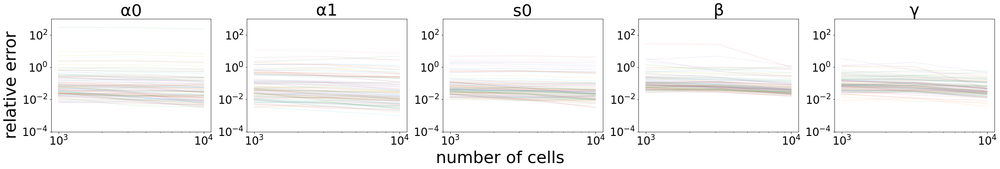

In [25]:
fig = plot_vary_n_results(results_dir+'topo_1_vary_n_1.pickle',ns=[1000,3162,10000])

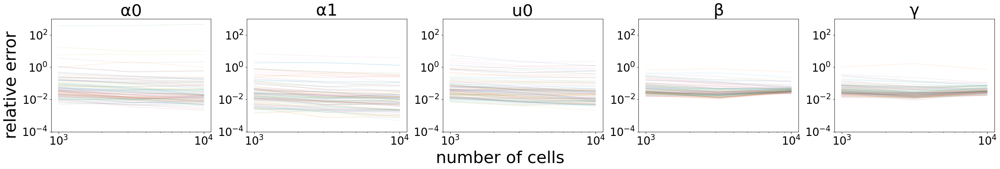

In [36]:
fig = plot_vary_n_results(results_dir+'topo_1_vary_n_1.pickle',ns=[1000,3162,10000])

n_init =  10


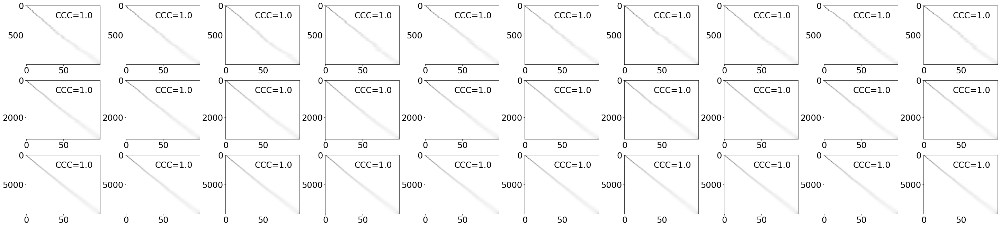

In [26]:
fig = plot_t_results(results_dir+'topo_1_vary_n_1.pickle')

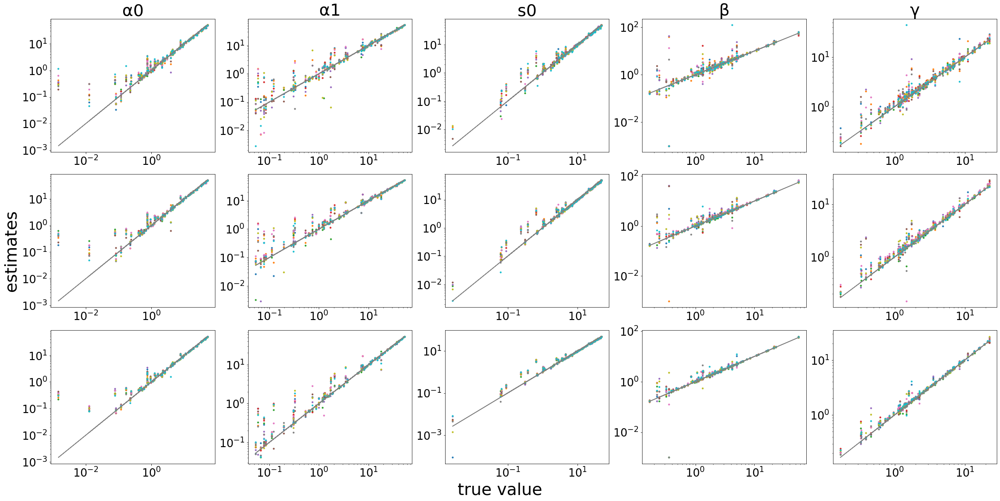

In [27]:
fig = plot_theta_results(results_dir+'topo_1_vary_n_1.pickle')

### topo 1 vary p

In [33]:
topo = np.array([[0,1]])
tau = (0,1)
results = fit_vary_p_fixed(topo, tau, n=1000, ps=[31,100,316], seed=1, K=10, n_init=10, epoch=100, m=100, cores=30)

with open(results_dir+'topo_1_vary_p_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

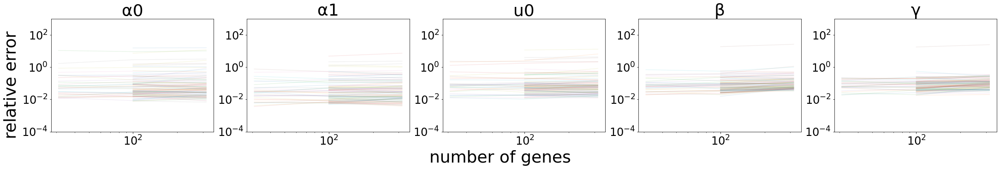

In [35]:
fig = plot_vary_p_results(results_dir+'topo_1_vary_p_1.pickle')

n_init =  10


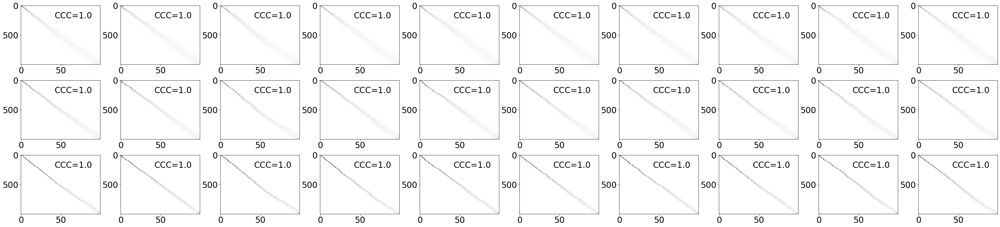

In [37]:
fig = plot_t_results(results_dir+'topo_1_vary_p_1.pickle')

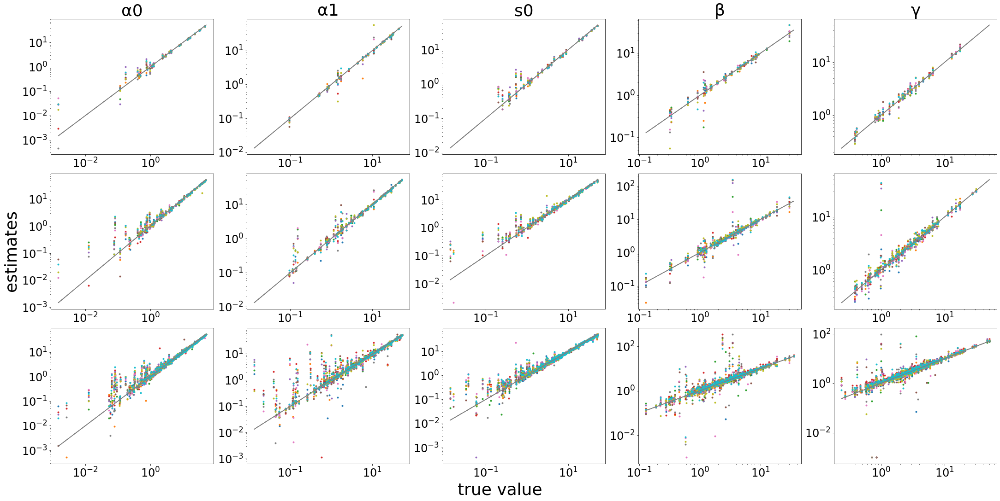

In [38]:
fig = plot_theta_results(results_dir+'topo_1_vary_p_1.pickle')

## Topo 2: one lineage with two transitions

### topo 2 vary n

In [34]:
topo = np.array([[0,1,2]])
tau = (0,1,2)
results = fit_vary_n_fixed(topo, tau, ns=[1000,3162,10000], p=100, seed=1, K=10, n_init=15, epoch=100, m=100, cores=30)

with open(results_dir+'topo_2_vary_n_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

n_init =  15


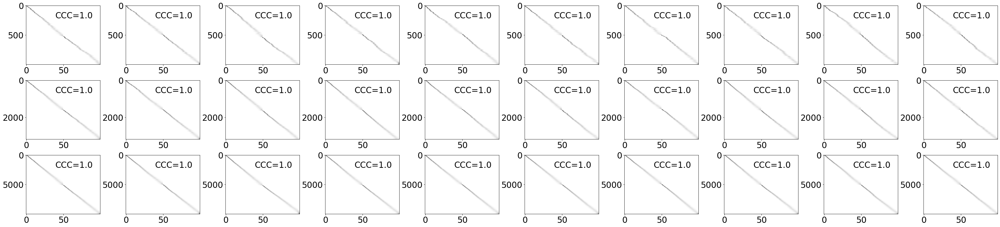

In [42]:
fig = plot_t_results(results_dir+'topo_2_vary_n_1.pickle')

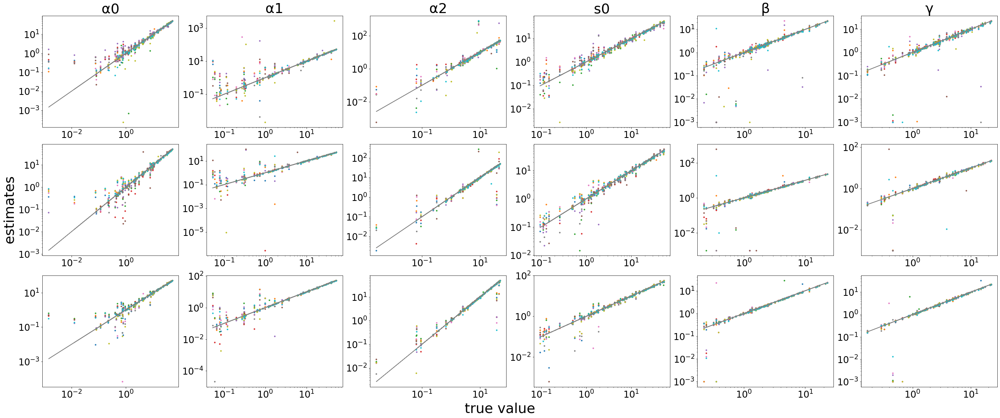

In [40]:
fig = plot_theta_results(results_dir+'topo_2_vary_n_1.pickle')

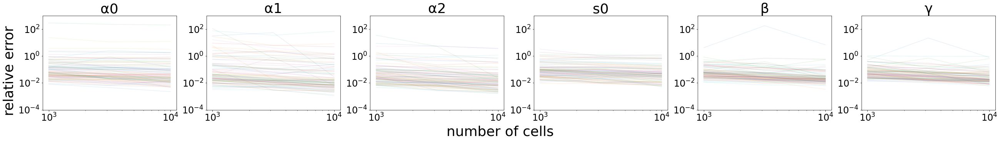

In [41]:
fig = plot_vary_n_results(results_dir+'topo_2_vary_n_1.pickle',K=10)

### topo 2 vary p

In [43]:
topo = np.array([[0,1,2]])
tau = (0,1,2)
results = fit_vary_p_fixed(topo, tau, n=1000, ps=[31,100,316], seed=1, K=10, n_init=15, m=100, epoch=100, cores=30)

with open(results_dir+'topo_2_vary_p_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

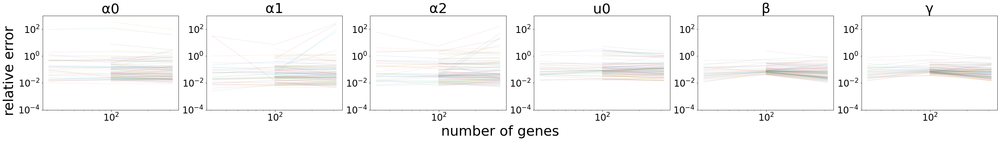

In [44]:
fig = plot_vary_p_results(results_dir+'topo_2_vary_p_1.pickle',ps=[31,100,316])

n_init =  15


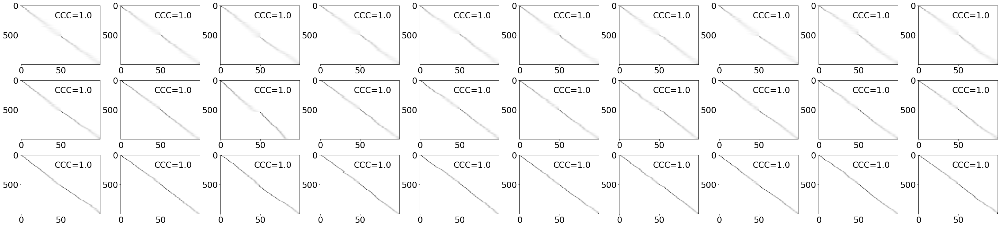

In [45]:
fig = plot_t_results(results_dir+'topo_2_vary_p_1.pickle')

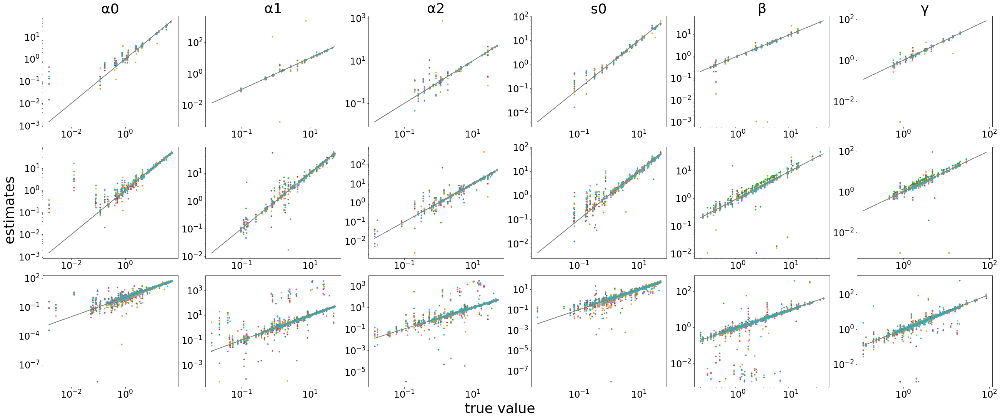

In [46]:
fig = plot_theta_results(results_dir+'topo_2_vary_p_1.pickle')

## Topo 3 : two lineages (bifurcation)

### topo 3 vary n

In [47]:
topo = np.array([[0,1],[0,2]])
tau = (0,1)
print(time.ctime())
results = fit_vary_n_fixed(topo, tau, ns=[1000,3162,10000], p=100, seed=1, K=10, n_init=15, m=100, epoch=100, cores=30)
print(time.ctime())
with open(results_dir+'topo_3_vary_n_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

Sun Feb 12 21:20:13 2023
Mon Feb 13 04:33:55 2023


n_init =  15


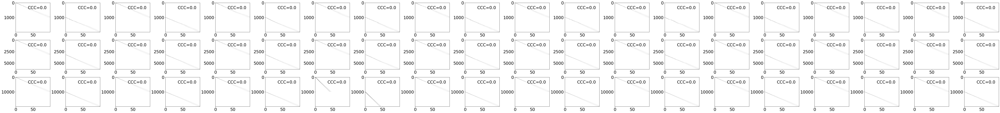

In [70]:
fig = plot_t_results(results_dir+'topo_3_vary_n_1.pickle')

6


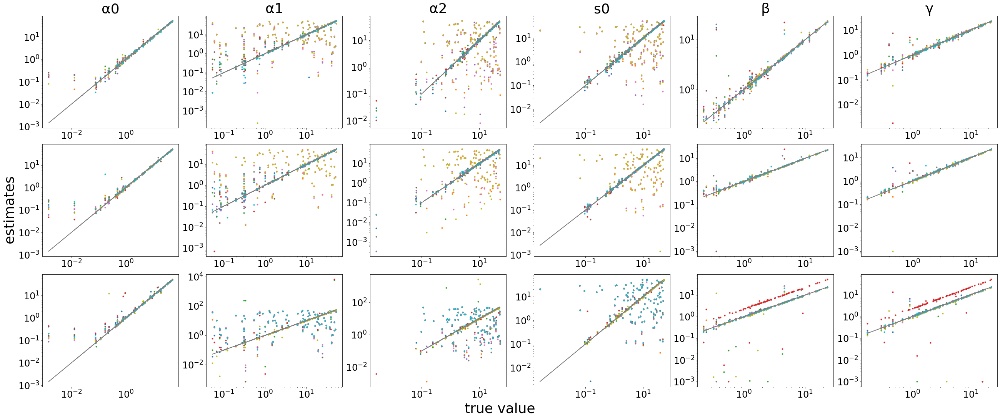

In [67]:
fig = plot_theta_results(results_dir+'topo_3_vary_n_1.pickle')

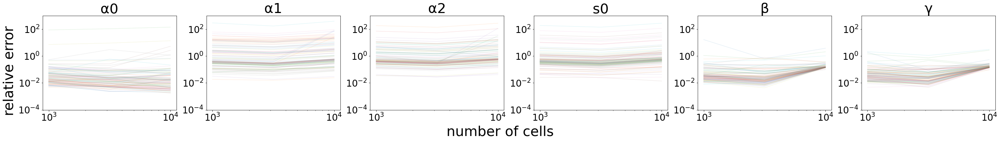

In [55]:
fig = plot_vary_n_results(results_dir+'topo_3_vary_n_1.pickle', ns=[1000,3162,10000])

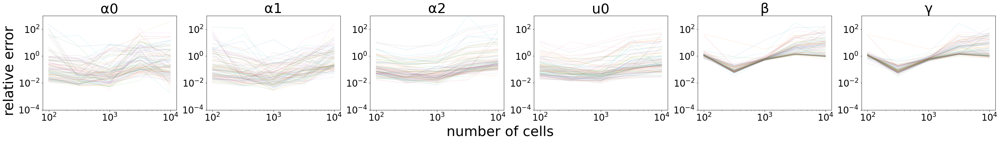

In [187]:
fig = plot_vary_n_results(results_dir+'topo_3_vary_n_2022_m100n10.pickle')

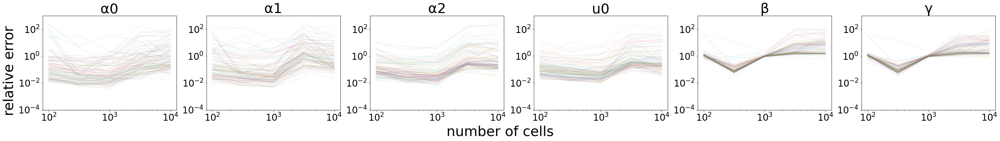

In [188]:
fig = plot_vary_n_results(results_dir+'topo_3_vary_n_2022_m100n5.pickle')

n_init =  30


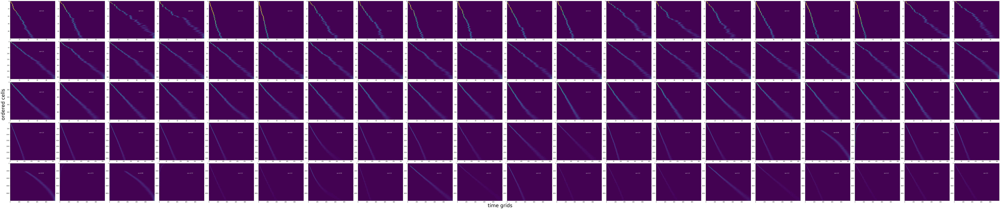

In [150]:
fig = plot_t_results(results_dir+'topo_3_vary_n_2022_m100n10.pickle')

n_init =  30


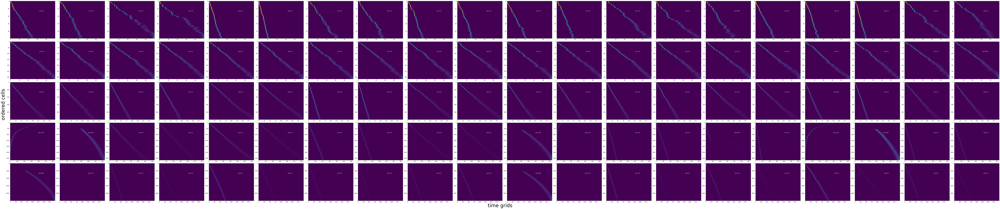

In [151]:
fig = plot_t_results(results_dir+'topo_3_vary_n_2022_m100n5.pickle')

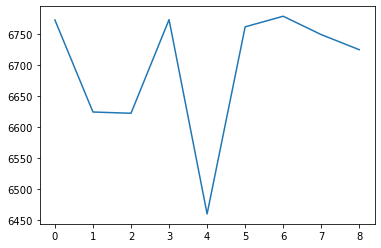

In [129]:
with open(results_dir+'topo_3_vary_n_20221129_m100.pickle', 'rb') as f:
    results = pickle.load(f)
    
traj = results[-11]
plt.plot(traj.elbos)

### topo 3 vary p

In [48]:
topo = np.array([[0,1],[0,2]])
tau = (0,1)
results = fit_vary_p_fixed(topo, tau, n=1000, ps=[31,100,316], seed=1, K=10, n_init=15, m=100, epoch=100, cores=30)

with open(results_dir+'topo_3_vary_p_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

n_init =  15


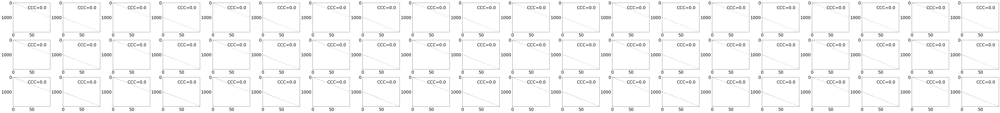

In [71]:
fig = plot_t_results(results_dir+'topo_3_vary_p_1.pickle')

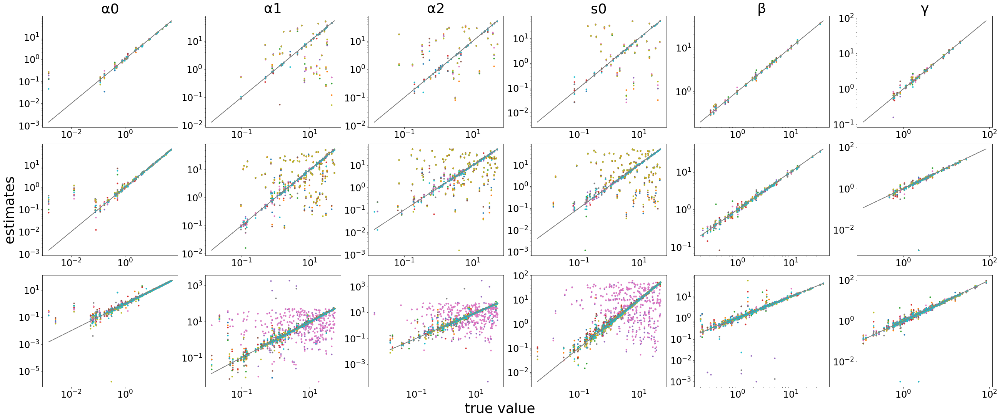

In [65]:
fig = plot_theta_results(results_dir+'topo_3_vary_p_1.pickle', K=10)

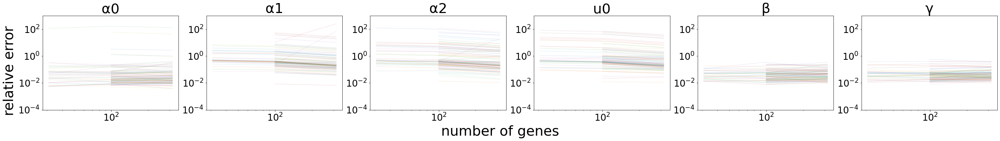

In [62]:
fig = plot_vary_p_results(results_dir+'topo_3_vary_p_1.pickle')

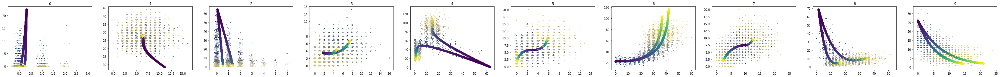

In [124]:
with open(results_dir+'topo_3_vary_p_2022_m100.pickle', 'rb') as f:
    results = pickle.load(f)
    
traj = results[-11]
plot_phase(traj)

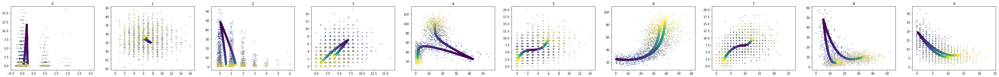

In [125]:
traj_true = copy.deepcopy(traj)
traj_true.fit(traj.X,theta=traj.true_theta,epoch=1)
plot_phase(traj_true)

# Topo 4

In [72]:
topo = np.array([[0,1,2],[0,1,3]])
tau = (0,1,2)
print(time.ctime())
results = fit_vary_n_fixed(topo, tau, ns=[1000,3162,10000], p=100, seed=1, K=10, n_init=20, m=100, epoch=100, cores=10)
print(time.ctime())
with open(results_dir+'topo_4_vary_n_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

Mon Feb 13 14:37:33 2023
Tue Feb 14 06:35:04 2023


n_init =  20


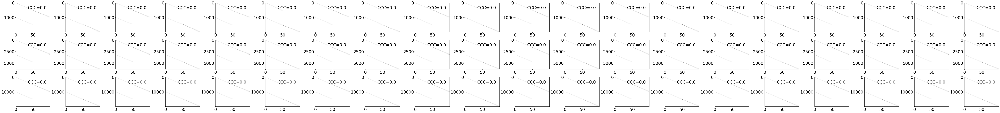

In [74]:
fig = plot_t_results(results_dir+'topo_4_vary_n_1.pickle')

7


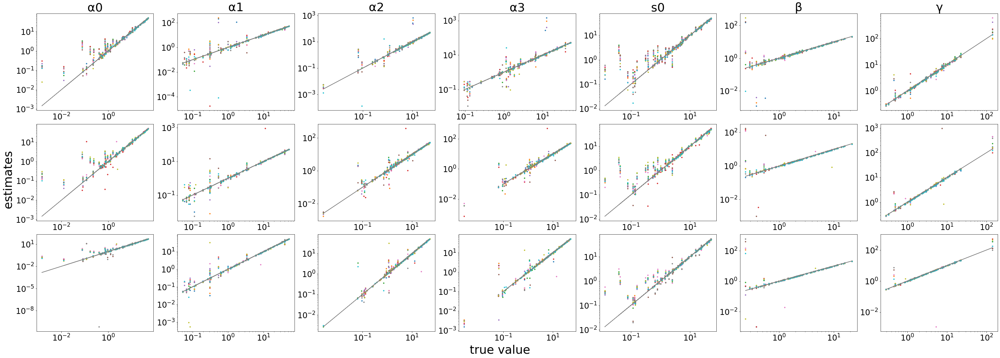

In [75]:
fig = plot_theta_results(results_dir+'topo_4_vary_n_1.pickle')

In [ ]:
topo = np.array([[0,1,2],[0,1,3]])
tau = (0,1,2)
print(time.ctime())
results = fit_vary_p_fixed(topo, tau, n=1000, ps=[31,100,316], seed=1, K=10, n_init=20, m=100, epoch=100, cores=30)
print(time.ctime())
with open(results_dir+'topo_4_vary_p_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

Fri Feb 17 10:00:48 2023


n_init =  20


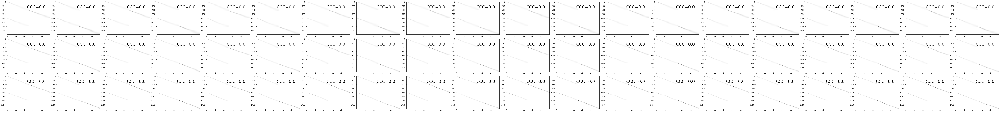

In [18]:
fig = plot_t_results(results_dir+'topo_4_vary_p_1.pickle')

7


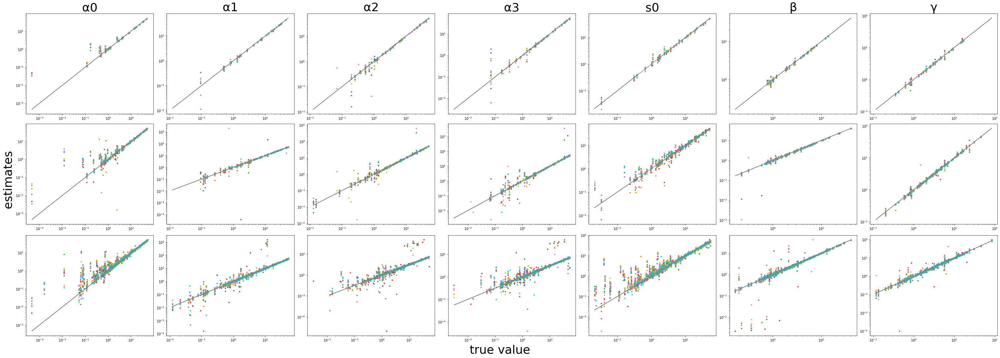

In [19]:
fig = plot_theta_results(results_dir+'topo_4_vary_p_1.pickle')

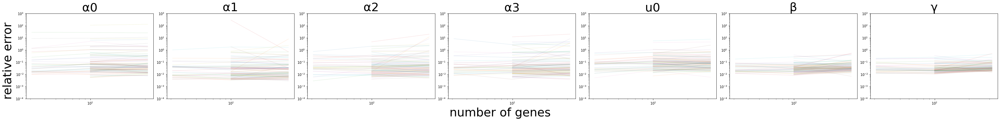

In [20]:
fig = plot_vary_p_results(results_dir+'topo_4_vary_p_1.pickle')

# Model selection

## null genes

In [18]:
import numpy as np

def simulate_data_with_null(topo, tau, n, p, null = 0.5, loga_max=4, logb_max=2, random_seed=42):
    np.random.seed(random_seed)
    L=len(topo)
    n_states=len(set(topo.flatten()))
    t=np.linspace(tau[0],tau[-1],n)
    true_t = []
    
    theta=np.zeros((p,n_states+4))
    for j in range(n_states+2):
        theta[:,j]=np.exp(np.random.uniform(0,loga_max,size=p))-1
    theta[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p))
    theta[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p))

    null_p = int(p*null)
    theta[:null_p,1]=theta[:null_p,0]
    theta[:null_p,-4]=theta[:null_p,0]
    theta[:null_p,-2]=1
    theta[:null_p,-1]=theta[:null_p,-4]/theta[:null_p,-3]

    Y = np.zeros((n*L,p,2))
    for l in range(L):
        theta_l = np.concatenate((theta[:,topo[l]], theta[:,-4:]), axis=1)
        Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
        true_t = np.append(true_t,t)

    X = np.random.poisson(Y)
    return theta, true_t, Y, X

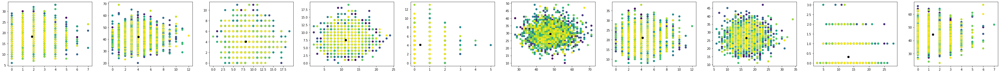

In [21]:
#%% generate data
topo = np.array([[0]])
tau = (0,1)
true_theta, t, Y, X = simulate_data_with_null(topo,tau,n=2000,p=200,random_seed=2023)

t = np.linspace(0,1,2000)
plot_p = 10
fig, ax = plt.subplots(1,plot_p,figsize=(6*plot_p,4))
for i in range(plot_p):
    j = 90 + i
    ax[i].scatter(X[:,j,0],X[:,j,1],c=t);
    ax[i].scatter(Y[:,j,0],Y[:,j,1],c='black');


In [20]:
traj = Trajectory(topo, tau)
res = traj.fit_multi_init(X,100,n_init=2,epoch=10,parallel=True,n_threads=2)

trial 1


100%|██████████| 10/10 [00:20<00:00,  2.08s/it]

trial 2



100%|██████████| 10/10 [00:17<00:00,  1.73s/it]


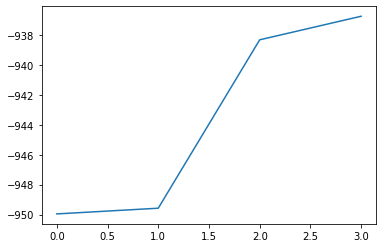

In [22]:
Q, elbos = res
plt.plot(elbos);

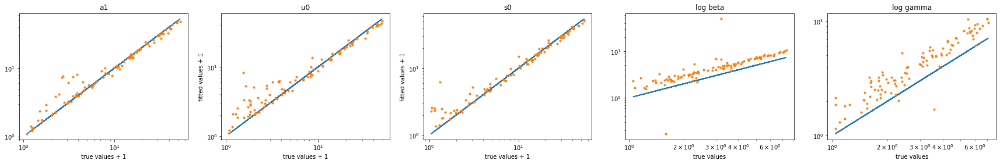

In [23]:
plot_theta(true_theta[100:],traj.theta[100:])

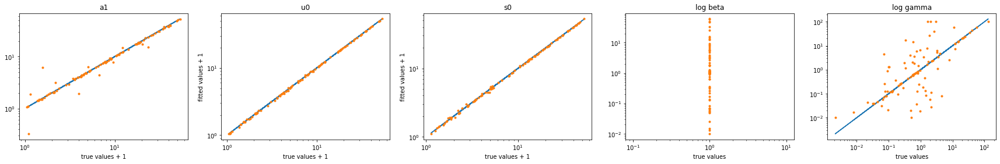

In [24]:
plot_theta(true_theta[:100],traj.theta[:100])

In [ ]:
plot_phase(X,traj.theta[:20],Q,topo,tau)

In [25]:
accepts = []
diffs = []
true_positive = 0
for j in range(100):
    nested_model = {j:[[0,-3],[-4,-4]]}
    accept, diff = traj.compare_model(X, nested_model)
    true_positive += accept
    accepts.append(accept)
    diffs.append(diff)


In [28]:
accepts = []
diffs = []
false_positive = 0
for j in range(100,200):
    nested_model = {j:[[0,-3],[-4,-4]]}
    accept, diff = traj.compare_model(X, nested_model)
    false_positive += accept
    accepts.append(accept)
    diffs.append(diff)


In [29]:
true_positive,false_positive

(95, 0)

## Partially changing genes

In [ ]:
import numpy as np

def simulate_data_with_partial_null(topo, tau, n, p, null_p = 10, loga_max=4, logb_max=2, random_seed=42):
    np.random.seed(random_seed)
    L=len(topo)
    n_states=len(set(topo.flatten()))
    assert n_states > 1
    t=np.linspace(tau[0],tau[-1],n)
    true_t = []
    
    theta=np.zeros((p,n_states+4))
    for j in range(n_states+2):
        theta[:,j]=np.exp(np.random.uniform(0,loga_max,size=p))-1
    theta[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p))
    theta[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p))

    theta[:null_p,1]=theta[:null_p,0]

    Y = np.zeros((n*L,p,2))
    for l in range(L):
        theta_l = np.concatenate((theta[:,topo[l]], theta[:,-4:]), axis=1)
        Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
        true_t = np.append(true_t,t)

    X = np.random.poisson(Y)
    return theta, true_t, Y, X

In [ ]:
#%% generate data
topo = np.array([[0,1]])
tau = (0,0.5,1)
true_theta, t, Y, X = simulate_data_with_partial_null(topo,tau,n=2000,p=100,random_seed=2023)

p = 20
fig, ax = plt.subplots(1,p,figsize=(6*p,4))
for i in range(p):
    ax[i].set_title(str(i));
    ax[i].scatter(X[:,i,0],X[:,i,1],c=t);
    ax[i].scatter(Y[:,i,0],Y[:,i,1],c='black');
# time increases from blue to yellow

In [ ]:
traj = Trajectory(topo, tau)
res = traj.fit_multi_init(X,100,n_init=10,epoch=10,parallel=True,n_threads=2)

In [ ]:
Q, elbos, thetas = res
plt.plot(elbos);

In [ ]:
plot_theta(true_theta[10:],traj.theta[10:])

In [ ]:
plot_phase(X,traj.theta[:20],Q,topo,tau)

In [ ]:
accepts = []
diffs = []
for j in range(20):
    nested_model = {j:[[1],[0]]}
    accept, diff = traj.compare_model(X, nested_model, parallel=True, n_threads=2)
    accepts.append(accept)
    diffs.append(diff)

In [ ]:
plt.plot(accepts);

In [ ]:
plot_phase(X,traj.new_theta[:20],Q,topo,tau)

In [ ]:
plt.plot(diffs)